In [3]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm

# Define learning parameters

In [4]:
# learning parameters
batch_size = 512
epochs = 100
sample_size = 64 # fixed sample size for generator
nz = 128 # latent vector size
k = 1 # number of steps to apply to the discriminator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Prepare training dataset

In [5]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])
to_pil_image = transforms.ToPILImage()

# Make input, output folders
!mkdir -p input
!mkdir -p outputs

# Load train data
train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

A subdirectory or file -p already exists.
Error occurred while processing: -p.
A subdirectory or file input already exists.
Error occurred while processing: input.
A subdirectory or file -p already exists.
Error occurred while processing: -p.
A subdirectory or file outputs already exists.
Error occurred while processing: outputs.


# Generator

In [6]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(
            nn.Linear(self.nz, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )
    def forward(self, x):
        return self.main(x).view(-1, 1, 28, 28)

# Discriminator

In [7]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

In [8]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)
print('##### GENERATOR #####')
print(generator)
print('######################')
print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

##### GENERATOR #####
Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=1024, out_features=784, bias=True)
    (7): Tanh()
  )
)
######################

##### DISCRIMINATOR #####
Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1

# Tools for training

In [9]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

In [10]:
# loss function
criterion = nn.BCELoss() # Binary Cross Entropy loss

In [11]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

In [12]:
# to create real labels (1s)
def label_real(size):
    data = torch.ones(size, 1)
    return data.to(device)
# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size, 1)
    return data.to(device)


In [13]:
# function to create the noise vector
def create_noise(sample_size, nz):
    return torch.randn(sample_size, nz).to(device)

In [14]:
# to save the images generated by the generator
def save_generator_image(image, path):
    save_image(image, path)

In [15]:
# create the noise vector - fixed to track how GAN is trained.
noise = create_noise(sample_size, nz)

# Q. Write training loop

### 1a.

118it [00:22,  5.30it/s]                                                                                               


Epoch 1 of 100
Generator loss: 1.34636657, Discriminator loss: 0.90722122


118it [00:24,  4.84it/s]                                                                                               


Epoch 2 of 100
Generator loss: 2.08962888, Discriminator loss: 1.31459118


118it [00:20,  5.88it/s]                                                                                               


Epoch 3 of 100
Generator loss: 4.03724619, Discriminator loss: 0.70545453


118it [00:18,  6.46it/s]                                                                                               


Epoch 4 of 100
Generator loss: 2.13159155, Discriminator loss: 1.28421963


118it [00:20,  5.66it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


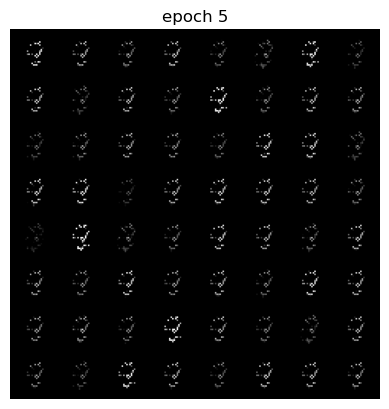

Epoch 5 of 100
Generator loss: 2.31523122, Discriminator loss: 1.09004479


118it [00:20,  5.89it/s]                                                                                               


Epoch 6 of 100
Generator loss: 1.90332534, Discriminator loss: 1.22462805


118it [00:19,  6.08it/s]                                                                                               


Epoch 7 of 100
Generator loss: 1.88778476, Discriminator loss: 1.02279587


118it [00:21,  5.48it/s]                                                                                               


Epoch 8 of 100
Generator loss: 1.42927757, Discriminator loss: 1.20448483


118it [00:30,  3.93it/s]                                                                                               


Epoch 9 of 100
Generator loss: 1.51202377, Discriminator loss: 1.19823073


118it [00:40,  2.89it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


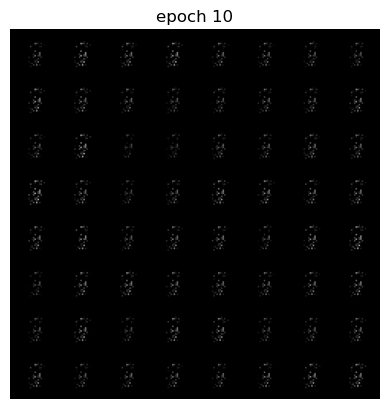

Epoch 10 of 100
Generator loss: 1.43912201, Discriminator loss: 1.01091769


118it [00:33,  3.53it/s]                                                                                               


Epoch 11 of 100
Generator loss: 1.71940927, Discriminator loss: 1.26828500


118it [00:26,  4.40it/s]                                                                                               


Epoch 12 of 100
Generator loss: 0.98803149, Discriminator loss: 1.26476692


118it [00:27,  4.36it/s]                                                                                               


Epoch 13 of 100
Generator loss: 1.32207551, Discriminator loss: 0.99314598


118it [00:28,  4.15it/s]                                                                                               


Epoch 14 of 100
Generator loss: 1.10912134, Discriminator loss: 1.10394376


118it [00:27,  4.32it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


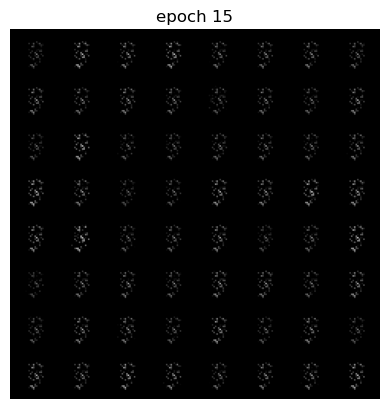

Epoch 15 of 100
Generator loss: 1.93844282, Discriminator loss: 1.03815582


118it [00:26,  4.48it/s]                                                                                               


Epoch 16 of 100
Generator loss: 1.78937347, Discriminator loss: 1.30249875


118it [00:27,  4.30it/s]                                                                                               


Epoch 17 of 100
Generator loss: 1.75367330, Discriminator loss: 1.02498898


118it [00:31,  3.73it/s]                                                                                               


Epoch 18 of 100
Generator loss: 1.65636878, Discriminator loss: 1.13334007


118it [00:48,  2.43it/s]                                                                                               


Epoch 19 of 100
Generator loss: 2.18776619, Discriminator loss: 0.79862399


118it [00:42,  2.75it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


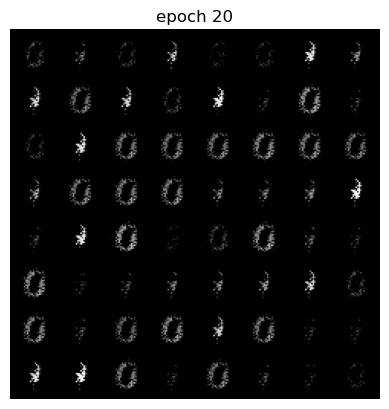

Epoch 20 of 100
Generator loss: 1.36875385, Discriminator loss: 0.96674518


118it [00:39,  3.00it/s]                                                                                               


Epoch 21 of 100
Generator loss: 1.90231718, Discriminator loss: 0.86584162


118it [00:26,  4.51it/s]                                                                                               


Epoch 22 of 100
Generator loss: 2.18290377, Discriminator loss: 0.74289791


118it [00:28,  4.17it/s]                                                                                               


Epoch 23 of 100
Generator loss: 2.74880536, Discriminator loss: 0.62446888


118it [00:26,  4.41it/s]                                                                                               


Epoch 24 of 100
Generator loss: 3.02714216, Discriminator loss: 0.63081066


118it [00:26,  4.39it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


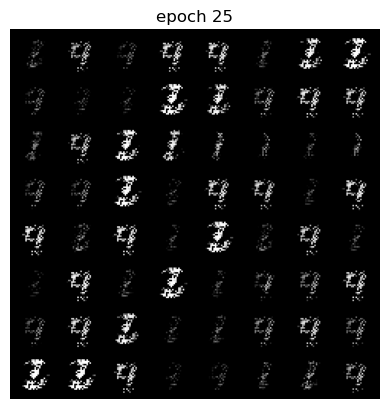

Epoch 25 of 100
Generator loss: 1.77211779, Discriminator loss: 0.84202875


118it [00:29,  4.07it/s]                                                                                               


Epoch 26 of 100
Generator loss: 1.97604382, Discriminator loss: 0.78766217


118it [00:36,  3.25it/s]                                                                                               


Epoch 27 of 100
Generator loss: 2.21152537, Discriminator loss: 0.60409714


118it [00:36,  3.22it/s]                                                                                               


Epoch 28 of 100
Generator loss: 2.11323815, Discriminator loss: 0.72033592


118it [00:35,  3.33it/s]                                                                                               


Epoch 29 of 100
Generator loss: 2.17149310, Discriminator loss: 0.62477685


118it [00:35,  3.29it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


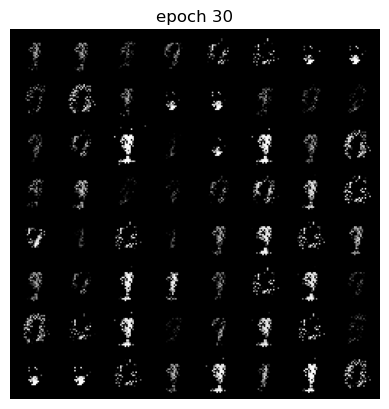

Epoch 30 of 100
Generator loss: 2.13240053, Discriminator loss: 0.79671615


118it [00:35,  3.32it/s]                                                                                               


Epoch 31 of 100
Generator loss: 2.23298609, Discriminator loss: 0.81977716


118it [00:35,  3.30it/s]                                                                                               


Epoch 32 of 100
Generator loss: 2.10228485, Discriminator loss: 0.78095928


118it [00:35,  3.33it/s]                                                                                               


Epoch 33 of 100
Generator loss: 2.77346403, Discriminator loss: 0.63244881


118it [00:36,  3.27it/s]                                                                                               


Epoch 34 of 100
Generator loss: 4.20374923, Discriminator loss: 0.54732366


118it [00:35,  3.31it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


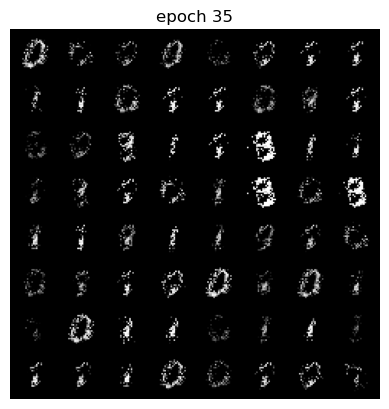

Epoch 35 of 100
Generator loss: 2.43076855, Discriminator loss: 0.73799381


118it [00:44,  2.66it/s]                                                                                               


Epoch 36 of 100
Generator loss: 1.99902848, Discriminator loss: 0.88257508


118it [00:39,  2.98it/s]                                                                                               


Epoch 37 of 100
Generator loss: 2.20475427, Discriminator loss: 0.75609899


118it [00:27,  4.30it/s]                                                                                               


Epoch 38 of 100
Generator loss: 2.30367770, Discriminator loss: 0.75212305


118it [00:30,  3.81it/s]                                                                                               


Epoch 39 of 100
Generator loss: 2.09802576, Discriminator loss: 0.78491493


118it [00:27,  4.35it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


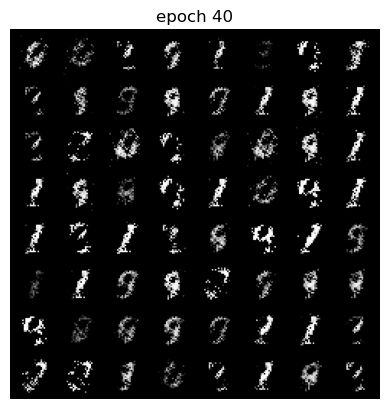

Epoch 40 of 100
Generator loss: 2.12333974, Discriminator loss: 0.81101889


118it [00:28,  4.20it/s]                                                                                               


Epoch 41 of 100
Generator loss: 2.46556941, Discriminator loss: 0.73467155


118it [00:26,  4.41it/s]                                                                                               


Epoch 42 of 100
Generator loss: 2.32000240, Discriminator loss: 0.74171244


118it [00:27,  4.33it/s]                                                                                               


Epoch 43 of 100
Generator loss: 2.18790344, Discriminator loss: 0.72815128


118it [00:27,  4.28it/s]                                                                                               


Epoch 44 of 100
Generator loss: 2.30132001, Discriminator loss: 0.65937664


118it [00:27,  4.33it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


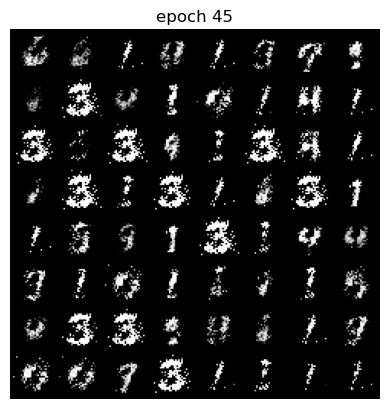

Epoch 45 of 100
Generator loss: 2.56505102, Discriminator loss: 0.65755760


118it [00:27,  4.25it/s]                                                                                               


Epoch 46 of 100
Generator loss: 2.83177793, Discriminator loss: 0.61707834


118it [00:27,  4.25it/s]                                                                                               


Epoch 47 of 100
Generator loss: 2.75918430, Discriminator loss: 0.60077134


118it [00:26,  4.39it/s]                                                                                               


Epoch 48 of 100
Generator loss: 2.82846518, Discriminator loss: 0.63826704


118it [00:26,  4.40it/s]                                                                                               


Epoch 49 of 100
Generator loss: 2.80061582, Discriminator loss: 0.62961422


118it [00:26,  4.45it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


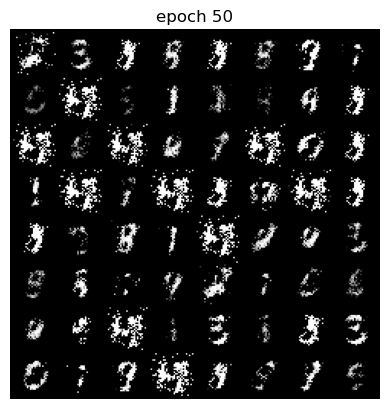

Epoch 50 of 100
Generator loss: 2.51873354, Discriminator loss: 0.65176596


118it [00:26,  4.44it/s]                                                                                               


Epoch 51 of 100
Generator loss: 2.55729633, Discriminator loss: 0.69443043


118it [00:27,  4.22it/s]                                                                                               


Epoch 52 of 100
Generator loss: 2.46509373, Discriminator loss: 0.70917116


118it [00:38,  3.04it/s]                                                                                               


Epoch 53 of 100
Generator loss: 2.59377897, Discriminator loss: 0.70752377


118it [00:35,  3.31it/s]                                                                                               


Epoch 54 of 100
Generator loss: 2.88586329, Discriminator loss: 0.61044986


118it [00:28,  4.14it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


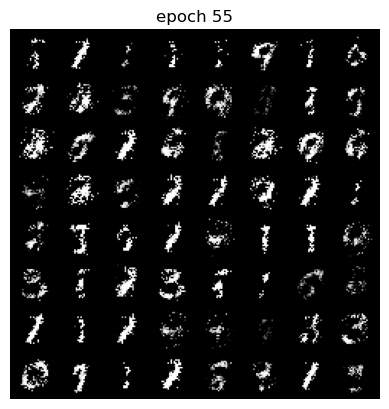

Epoch 55 of 100
Generator loss: 2.73212043, Discriminator loss: 0.63895063


118it [00:28,  4.18it/s]                                                                                               


Epoch 56 of 100
Generator loss: 2.32067090, Discriminator loss: 0.66198801


118it [00:27,  4.31it/s]                                                                                               


Epoch 57 of 100
Generator loss: 2.55022869, Discriminator loss: 0.68802621


118it [00:27,  4.26it/s]                                                                                               


Epoch 58 of 100
Generator loss: 2.68788692, Discriminator loss: 0.62896538


118it [00:27,  4.37it/s]                                                                                               


Epoch 59 of 100
Generator loss: 2.44787561, Discriminator loss: 0.70823639


118it [00:30,  3.92it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


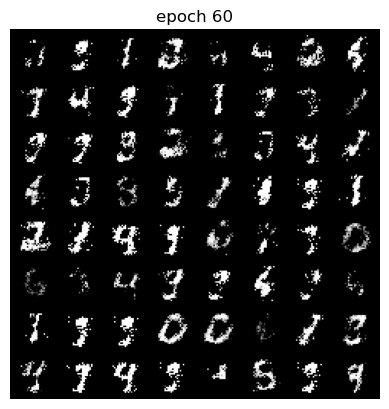

Epoch 60 of 100
Generator loss: 2.52498347, Discriminator loss: 0.69753744


118it [00:35,  3.30it/s]                                                                                               


Epoch 61 of 100
Generator loss: 2.53791714, Discriminator loss: 0.65048066


118it [00:27,  4.29it/s]                                                                                               


Epoch 62 of 100
Generator loss: 2.32613184, Discriminator loss: 0.69974585


118it [00:26,  4.44it/s]                                                                                               


Epoch 63 of 100
Generator loss: 2.36751659, Discriminator loss: 0.69670415


118it [00:27,  4.34it/s]                                                                                               


Epoch 64 of 100
Generator loss: 2.24243394, Discriminator loss: 0.71716098


118it [00:28,  4.16it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


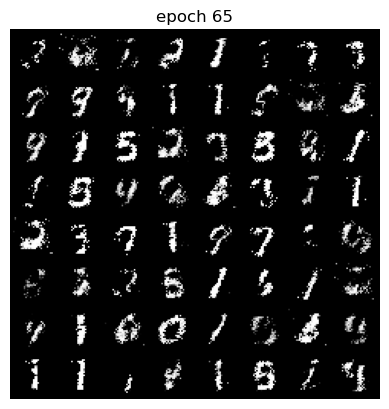

Epoch 65 of 100
Generator loss: 2.30306297, Discriminator loss: 0.70854759


118it [00:28,  4.20it/s]                                                                                               


Epoch 66 of 100
Generator loss: 2.23079658, Discriminator loss: 0.71053475


118it [00:29,  4.05it/s]                                                                                               


Epoch 67 of 100
Generator loss: 2.29566380, Discriminator loss: 0.71527302


118it [00:27,  4.33it/s]                                                                                               


Epoch 68 of 100
Generator loss: 2.15963151, Discriminator loss: 0.74365202


118it [00:27,  4.24it/s]                                                                                               


Epoch 69 of 100
Generator loss: 2.20893266, Discriminator loss: 0.73397110


118it [00:31,  3.80it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


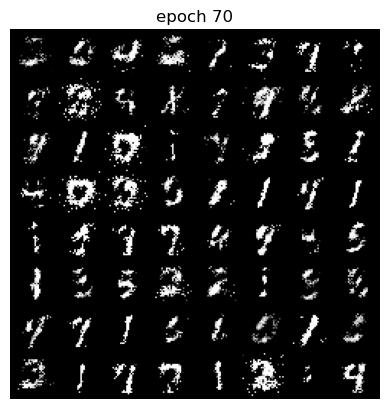

Epoch 70 of 100
Generator loss: 2.20590552, Discriminator loss: 0.76515628


118it [00:37,  3.17it/s]                                                                                               


Epoch 71 of 100
Generator loss: 2.08888458, Discriminator loss: 0.76568444


118it [00:29,  4.00it/s]                                                                                               


Epoch 72 of 100
Generator loss: 2.04418408, Discriminator loss: 0.75214664


118it [00:27,  4.34it/s]                                                                                               


Epoch 73 of 100
Generator loss: 2.15603388, Discriminator loss: 0.71841789


118it [00:27,  4.24it/s]                                                                                               


Epoch 74 of 100
Generator loss: 2.15029621, Discriminator loss: 0.73922445


118it [00:27,  4.30it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


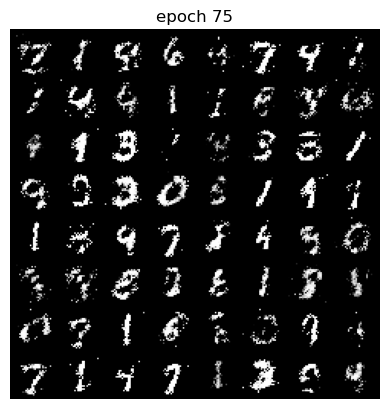

Epoch 75 of 100
Generator loss: 2.17837354, Discriminator loss: 0.73810444


118it [00:27,  4.28it/s]                                                                                               


Epoch 76 of 100
Generator loss: 2.13866814, Discriminator loss: 0.73409163


118it [00:27,  4.36it/s]                                                                                               


Epoch 77 of 100
Generator loss: 2.22828106, Discriminator loss: 0.71794260


118it [00:27,  4.31it/s]                                                                                               


Epoch 78 of 100
Generator loss: 2.10055726, Discriminator loss: 0.73691761


118it [00:30,  3.93it/s]                                                                                               


Epoch 79 of 100
Generator loss: 2.16451901, Discriminator loss: 0.75733081


118it [00:36,  3.26it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


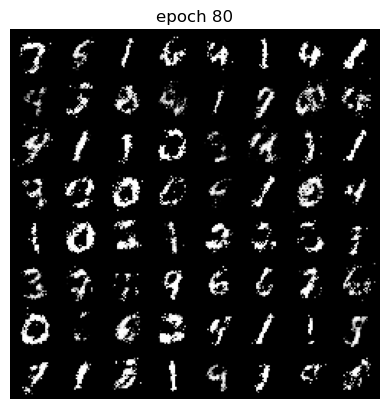

Epoch 80 of 100
Generator loss: 2.06146934, Discriminator loss: 0.76522572


118it [00:31,  3.76it/s]                                                                                               


Epoch 81 of 100
Generator loss: 2.10763168, Discriminator loss: 0.75824203


118it [00:27,  4.35it/s]                                                                                               


Epoch 82 of 100
Generator loss: 2.02281545, Discriminator loss: 0.79040910


118it [00:27,  4.30it/s]                                                                                               


Epoch 83 of 100
Generator loss: 1.99995850, Discriminator loss: 0.81157782


118it [00:27,  4.27it/s]                                                                                               


Epoch 84 of 100
Generator loss: 2.02483937, Discriminator loss: 0.78486134


118it [00:27,  4.26it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


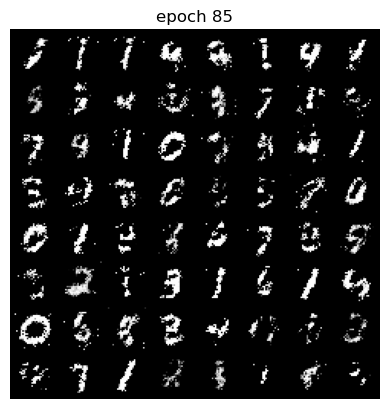

Epoch 85 of 100
Generator loss: 2.13073180, Discriminator loss: 0.73274512


118it [00:27,  4.30it/s]                                                                                               


Epoch 86 of 100
Generator loss: 2.17121492, Discriminator loss: 0.73417074


118it [00:27,  4.37it/s]                                                                                               


Epoch 87 of 100
Generator loss: 2.10947204, Discriminator loss: 0.72804505


118it [00:30,  3.90it/s]                                                                                               


Epoch 88 of 100
Generator loss: 2.14681391, Discriminator loss: 0.75552879


118it [00:39,  2.99it/s]                                                                                               


Epoch 89 of 100
Generator loss: 2.06133459, Discriminator loss: 0.76926013


118it [00:41,  2.83it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


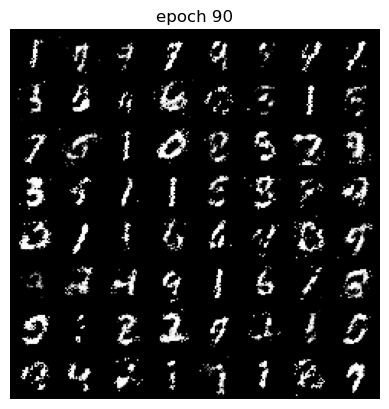

Epoch 90 of 100
Generator loss: 1.93755005, Discriminator loss: 0.80934346


118it [00:34,  3.43it/s]                                                                                               


Epoch 91 of 100
Generator loss: 1.93867597, Discriminator loss: 0.83393489


118it [00:28,  4.15it/s]                                                                                               


Epoch 92 of 100
Generator loss: 1.96036621, Discriminator loss: 0.82530399


118it [00:28,  4.21it/s]                                                                                               


Epoch 93 of 100
Generator loss: 2.02363136, Discriminator loss: 0.79845323


118it [00:28,  4.16it/s]                                                                                               


Epoch 94 of 100
Generator loss: 1.91652205, Discriminator loss: 0.82337761


118it [00:30,  3.85it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


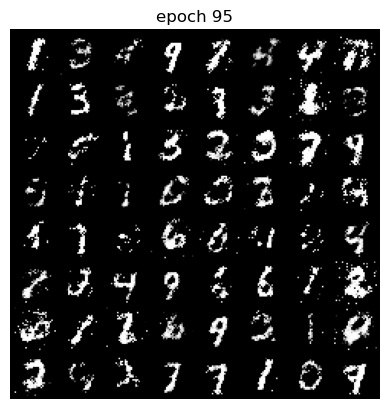

Epoch 95 of 100
Generator loss: 1.98089090, Discriminator loss: 0.82267933


118it [00:35,  3.33it/s]                                                                                               


Epoch 96 of 100
Generator loss: 1.86253165, Discriminator loss: 0.83927929


118it [00:38,  3.04it/s]                                                                                               


Epoch 97 of 100
Generator loss: 1.87773854, Discriminator loss: 0.80436349


118it [00:35,  3.33it/s]                                                                                               


Epoch 98 of 100
Generator loss: 1.89199017, Discriminator loss: 0.83713807


118it [00:36,  3.20it/s]                                                                                               


Epoch 99 of 100
Generator loss: 1.85258182, Discriminator loss: 0.85653888


118it [00:35,  3.34it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


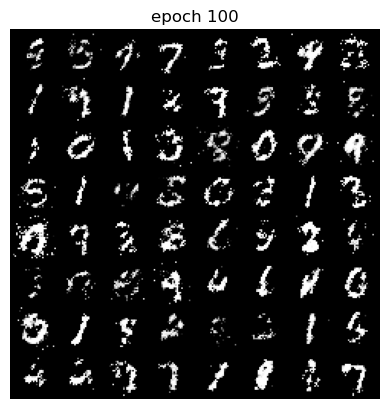

Epoch 100 of 100
Generator loss: 1.86612914, Discriminator loss: 0.81193631


In [16]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    # Generator loss
    return criterion(output, true_label)

def discriminator_loss(output, true_label):
    # Discriminator loss
    return criterion(output, true_label)
    

for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        
        real_images, _ = data
        real_images = real_images.to(device)

        # Train the discriminator
        optim_d.zero_grad()

        # Generate fake images
        fake_images = generator(noise)

        # Discriminator predictions for real and fake images
        real_preds = discriminator(real_images)
        fake_preds = discriminator(fake_images.detach())

        # Discriminator loss
        d_real_loss = discriminator_loss(real_preds, label_real(len(real_preds)))
        d_fake_loss = discriminator_loss(fake_preds, label_fake(len(fake_preds)))
        d_loss = d_real_loss + d_fake_loss

        # Backpropagation and optimization
        d_loss.backward()
        optim_d.step()

        # Train the generator
        optim_g.zero_grad()

        # Generate fake images
        fake_images = generator(noise)

        # Discriminator predictions for fake images
        fake_preds = discriminator(fake_images)

        # Generator loss
        g_loss = generator_loss(fake_preds, label_real(len(fake_preds)))

        # Backpropagation and optimization
        g_loss.backward()
        optim_g.step()

        # Update loss values
        loss_g += g_loss.item()
        loss_d += d_loss.item()
        
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/1a/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [17]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/1a/generator.pth')

DONE TRAINING


In [18]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/1a/generator_images.gif', imgs)

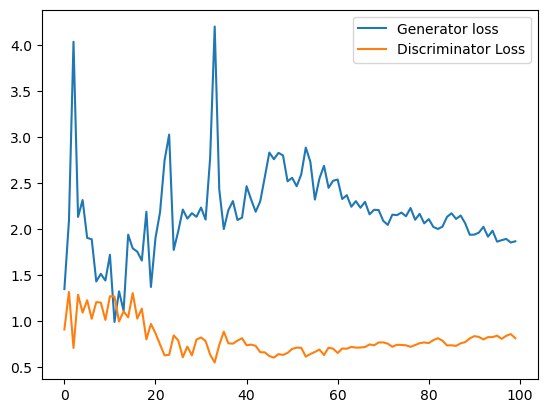

In [19]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/1a/loss.png')

### 1b.

In [14]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

118it [00:29,  4.04it/s]                                                                                               


Epoch 1 of 100
Generator loss: 0.05949367, Discriminator loss: 0.08208709


118it [00:34,  3.40it/s]                                                                                               


Epoch 2 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:40,  2.95it/s]                                                                                               


Epoch 3 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.27it/s]                                                                                               


Epoch 4 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.29it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


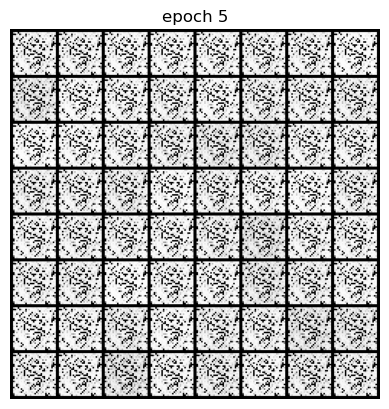

Epoch 5 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.13it/s]                                                                                               


Epoch 6 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.33it/s]                                                                                               


Epoch 7 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.33it/s]                                                                                               


Epoch 8 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:26,  4.40it/s]                                                                                               


Epoch 9 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.27it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


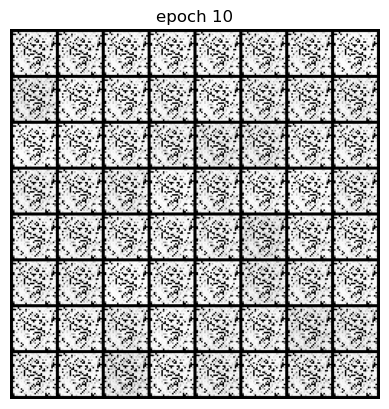

Epoch 10 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:45,  2.62it/s]                                                                                               


Epoch 11 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:46,  2.52it/s]                                                                                               


Epoch 12 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:42,  2.80it/s]                                                                                               


Epoch 13 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.21it/s]                                                                                               


Epoch 14 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.19it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


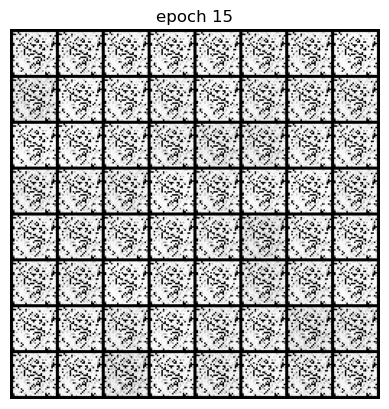

Epoch 15 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:26,  4.37it/s]                                                                                               


Epoch 16 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:26,  4.45it/s]                                                                                               


Epoch 17 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.26it/s]                                                                                               


Epoch 18 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:36,  3.27it/s]                                                                                               


Epoch 19 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:36,  3.21it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


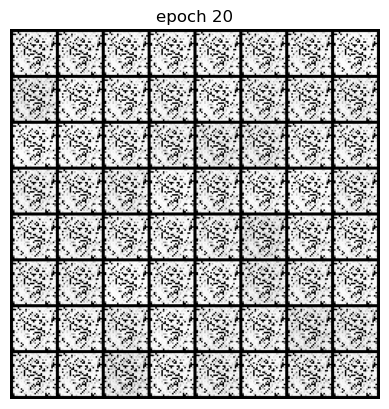

Epoch 20 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.30it/s]                                                                                               


Epoch 21 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.29it/s]                                                                                               


Epoch 22 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.32it/s]                                                                                               


Epoch 23 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.35it/s]                                                                                               


Epoch 24 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.30it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


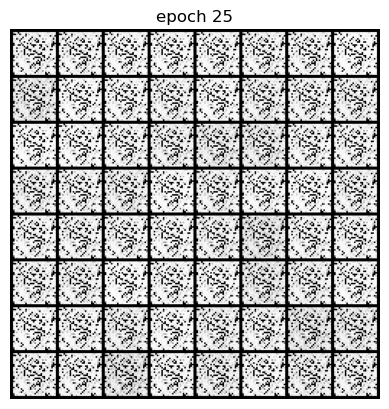

Epoch 25 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:36,  3.27it/s]                                                                                               


Epoch 26 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.29it/s]                                                                                               


Epoch 27 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:42,  2.77it/s]                                                                                               


Epoch 28 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:42,  2.78it/s]                                                                                               


Epoch 29 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.22it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


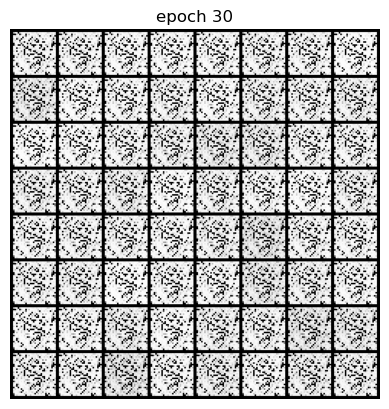

Epoch 30 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.08it/s]                                                                                               


Epoch 31 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:29,  4.04it/s]                                                                                               


Epoch 32 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.36it/s]                                                                                               


Epoch 33 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:26,  4.43it/s]                                                                                               


Epoch 34 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.34it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


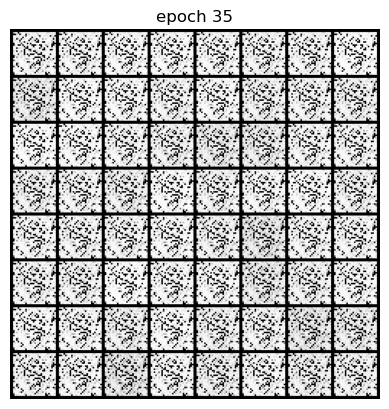

Epoch 35 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.30it/s]                                                                                               


Epoch 36 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.31it/s]                                                                                               


Epoch 37 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.34it/s]                                                                                               


Epoch 38 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.16it/s]                                                                                               


Epoch 39 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.31it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


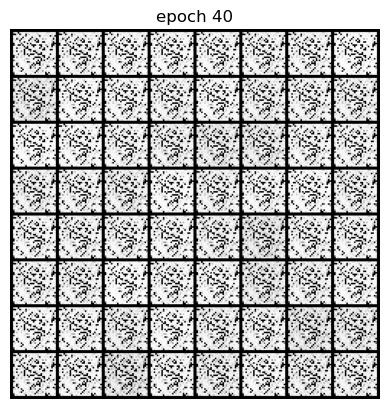

Epoch 40 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:26,  4.51it/s]                                                                                               


Epoch 41 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.33it/s]                                                                                               


Epoch 42 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:26,  4.49it/s]                                                                                               


Epoch 43 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.28it/s]                                                                                               


Epoch 44 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.37it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


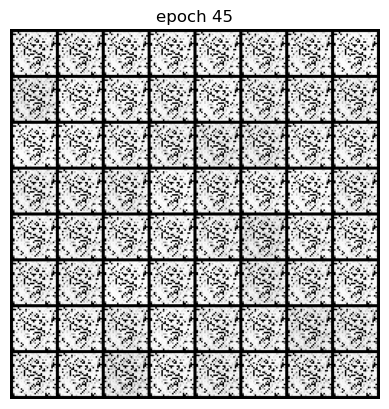

Epoch 45 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:39,  2.98it/s]                                                                                               


Epoch 46 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:30,  3.88it/s]                                                                                               


Epoch 47 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:29,  4.04it/s]                                                                                               


Epoch 48 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.16it/s]                                                                                               


Epoch 49 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.26it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


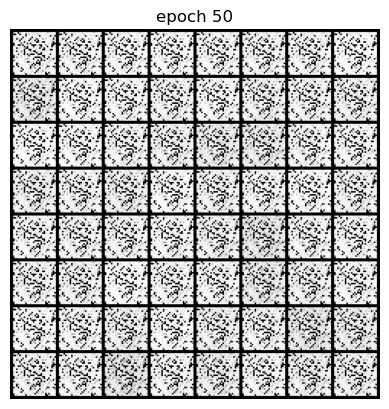

Epoch 50 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.28it/s]                                                                                               


Epoch 51 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:30,  3.92it/s]                                                                                               


Epoch 52 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.32it/s]                                                                                               


Epoch 53 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.19it/s]                                                                                               


Epoch 54 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.32it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


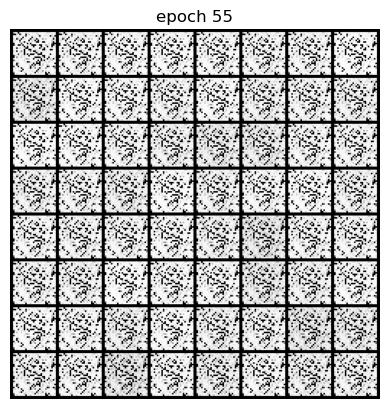

Epoch 55 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.30it/s]                                                                                               


Epoch 56 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.20it/s]                                                                                               


Epoch 57 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.35it/s]                                                                                               


Epoch 58 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:29,  4.02it/s]                                                                                               


Epoch 59 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.25it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


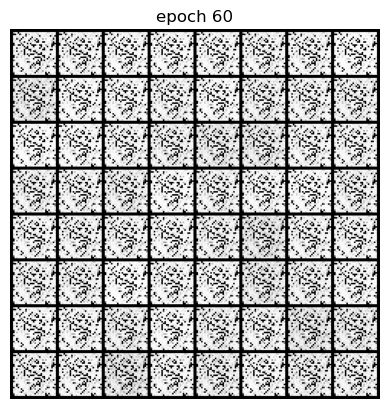

Epoch 60 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.30it/s]                                                                                               


Epoch 61 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:30,  3.86it/s]                                                                                               


Epoch 62 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:36,  3.23it/s]                                                                                               


Epoch 63 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:29,  3.99it/s]                                                                                               


Epoch 64 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.36it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


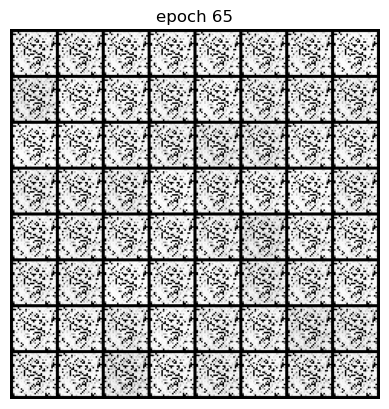

Epoch 65 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.19it/s]                                                                                               


Epoch 66 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.32it/s]                                                                                               


Epoch 67 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.33it/s]                                                                                               


Epoch 68 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.36it/s]                                                                                               


Epoch 69 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.29it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


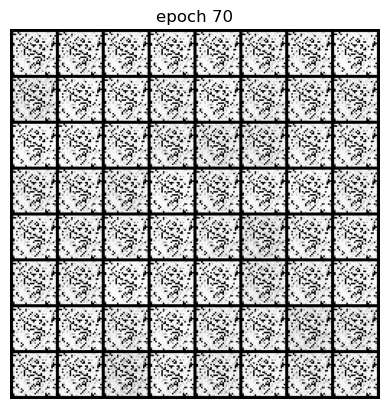

Epoch 70 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:29,  4.00it/s]                                                                                               


Epoch 71 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:34,  3.40it/s]                                                                                               


Epoch 72 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:33,  3.55it/s]                                                                                               


Epoch 73 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:26,  4.39it/s]                                                                                               


Epoch 74 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.31it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


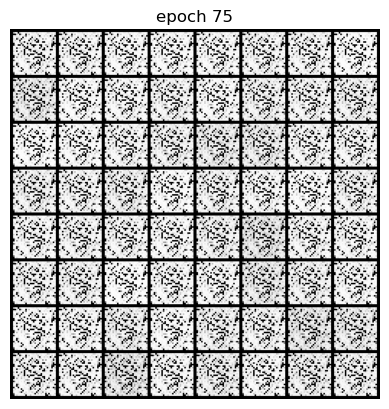

Epoch 75 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.31it/s]                                                                                               


Epoch 76 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.31it/s]                                                                                               


Epoch 77 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.35it/s]                                                                                               


Epoch 78 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.34it/s]                                                                                               


Epoch 79 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.09it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


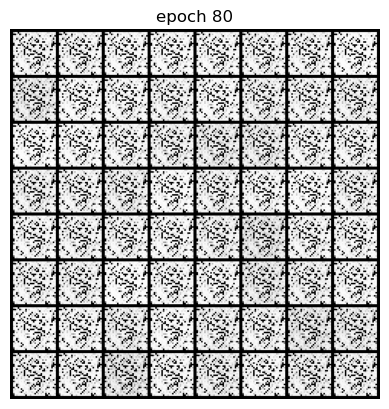

Epoch 80 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:38,  3.04it/s]                                                                                               


Epoch 81 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:40,  2.92it/s]                                                                                               


Epoch 82 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:36,  3.23it/s]                                                                                               


Epoch 83 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.27it/s]                                                                                               


Epoch 84 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:27,  4.27it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


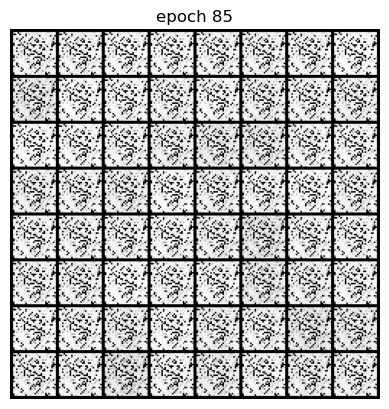

Epoch 85 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:28,  4.16it/s]                                                                                               


Epoch 86 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:29,  4.03it/s]                                                                                               


Epoch 87 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:34,  3.43it/s]                                                                                               


Epoch 88 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:38,  3.06it/s]                                                                                               


Epoch 89 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.32it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


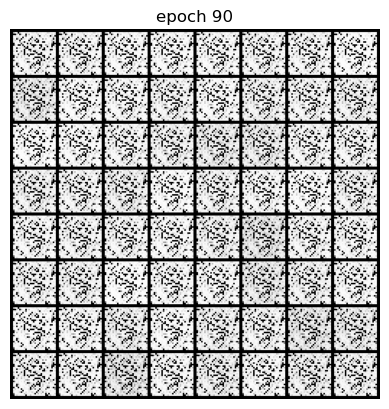

Epoch 90 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:36,  3.19it/s]                                                                                               


Epoch 91 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:35,  3.32it/s]                                                                                               


Epoch 92 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:25,  4.68it/s]                                                                                               


Epoch 93 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:22,  5.16it/s]                                                                                               


Epoch 94 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:21,  5.50it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


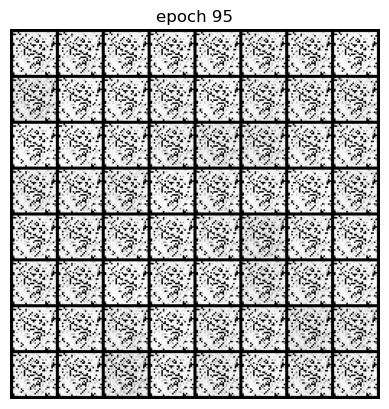

Epoch 95 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:21,  5.39it/s]                                                                                               


Epoch 96 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:21,  5.41it/s]                                                                                               


Epoch 97 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:22,  5.26it/s]                                                                                               


Epoch 98 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:25,  4.62it/s]                                                                                               


Epoch 99 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:31,  3.77it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


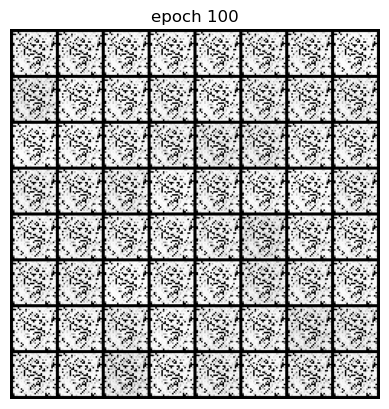

Epoch 100 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


In [15]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    # Generator loss
    return criterion(output, true_label)

def discriminator_loss(output, true_label):
    # Discriminator loss
    return criterion(output, true_label)
    

for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        
        real_images, _ = data
        real_images = real_images.to(device)

        # Train the discriminator
        optim_d.zero_grad()

        # Generate fake images
        fake_images = generator(noise)

        # Discriminator predictions for real and fake images
        real_preds = discriminator(real_images)
        fake_preds = discriminator(fake_images.detach())

        # Discriminator loss
        d_real_loss = discriminator_loss(real_preds, label_real(len(real_preds)))
        d_fake_loss = discriminator_loss(fake_preds, label_fake(len(fake_preds)))
        d_loss = d_real_loss + d_fake_loss

        # Backpropagation and optimization
        d_loss.backward()
        optim_d.step()

        # Train the generator
        optim_g.zero_grad()

        # Generate fake images
        fake_images = generator(noise)

        # Discriminator predictions for fake images
        fake_preds = discriminator(fake_images)

        # Generator loss
        g_loss = generator_loss(fake_preds, label_fake(len(fake_preds)))

        # Backpropagation and optimization
        g_loss.backward()
        optim_g.step()

        # Update loss values
        loss_g += g_loss.item()
        loss_d += d_loss.item()
        
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/1b/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [16]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/1b/generator.pth')

DONE TRAINING


In [17]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/1b/generator_images.gif', imgs)

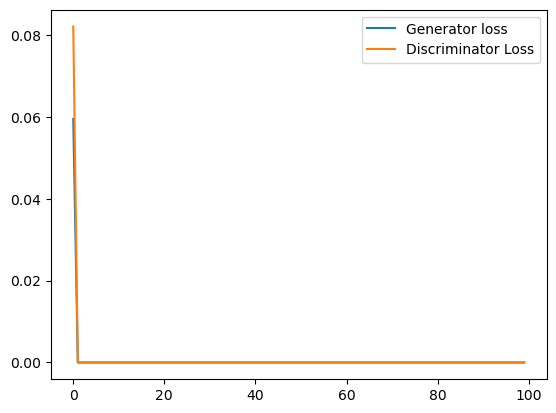

In [18]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/1b/loss.png')

### 1c.

In [25]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

118it [00:30,  3.92it/s]                                                                                               


Epoch 1 of 100
Generator loss: 5.65143659, Discriminator loss: 0.60667546


118it [00:32,  3.66it/s]                                                                                               


Epoch 2 of 100
Generator loss: 6.27925798, Discriminator loss: 0.15376480


118it [00:47,  2.47it/s]                                                                                               


Epoch 3 of 100
Generator loss: 6.77907830, Discriminator loss: 0.12131260


118it [00:26,  4.46it/s]                                                                                               


Epoch 4 of 100
Generator loss: 6.43662360, Discriminator loss: 0.14886164


118it [00:26,  4.38it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


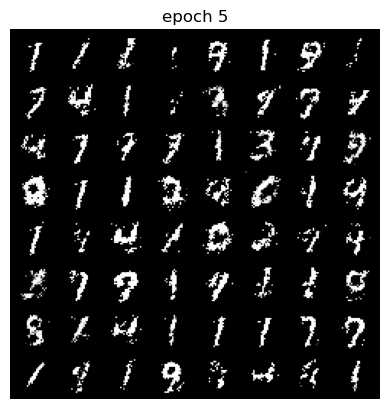

Epoch 5 of 100
Generator loss: 6.21983564, Discriminator loss: 0.14850041


118it [00:27,  4.36it/s]                                                                                               


Epoch 6 of 100
Generator loss: 5.78617409, Discriminator loss: 0.17821584


118it [00:27,  4.35it/s]                                                                                               


Epoch 7 of 100
Generator loss: 5.21435525, Discriminator loss: 0.21277860


118it [00:26,  4.37it/s]                                                                                               


Epoch 8 of 100
Generator loss: 4.57699014, Discriminator loss: 0.28344433


118it [00:27,  4.37it/s]                                                                                               


Epoch 9 of 100
Generator loss: 3.88121817, Discriminator loss: 0.35634516


118it [00:26,  4.41it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


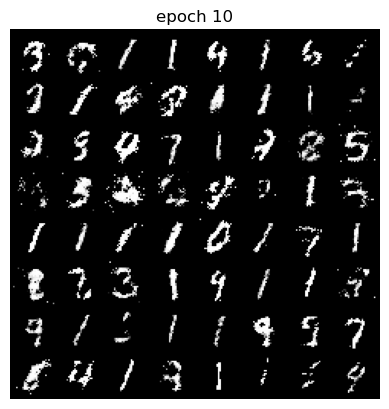

Epoch 10 of 100
Generator loss: 3.30147554, Discriminator loss: 0.41335518


118it [00:26,  4.41it/s]                                                                                               


Epoch 11 of 100
Generator loss: 3.16263679, Discriminator loss: 0.45372957


118it [00:27,  4.27it/s]                                                                                               


Epoch 12 of 100
Generator loss: 3.01822120, Discriminator loss: 0.46781346


118it [00:26,  4.47it/s]                                                                                               


Epoch 13 of 100
Generator loss: 2.89636861, Discriminator loss: 0.48368703


118it [00:26,  4.40it/s]                                                                                               


Epoch 14 of 100
Generator loss: 2.70903121, Discriminator loss: 0.52429977


118it [00:26,  4.44it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


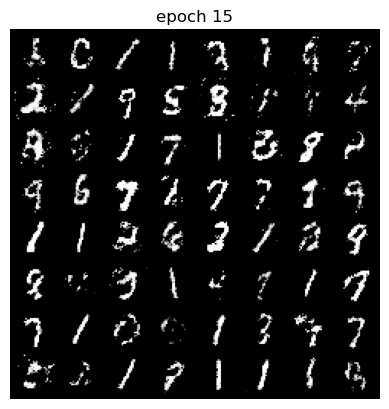

Epoch 15 of 100
Generator loss: 2.70737861, Discriminator loss: 0.52509231


118it [00:26,  4.40it/s]                                                                                               


Epoch 16 of 100
Generator loss: 2.58836053, Discriminator loss: 0.54420088


118it [00:26,  4.43it/s]                                                                                               


Epoch 17 of 100
Generator loss: 2.73691329, Discriminator loss: 0.52892970


118it [00:26,  4.47it/s]                                                                                               


Epoch 18 of 100
Generator loss: 2.63501977, Discriminator loss: 0.54343102


118it [00:26,  4.46it/s]                                                                                               


Epoch 19 of 100
Generator loss: 2.59958027, Discriminator loss: 0.57551060


118it [00:26,  4.45it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


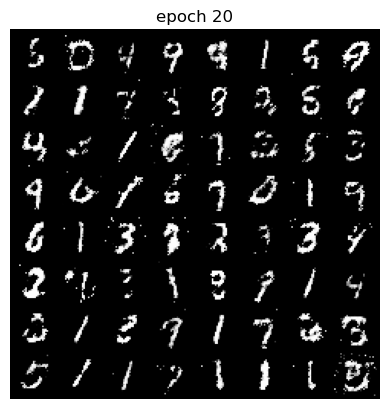

Epoch 20 of 100
Generator loss: 2.60461996, Discriminator loss: 0.57301714


118it [00:26,  4.48it/s]                                                                                               


Epoch 21 of 100
Generator loss: 2.48251580, Discriminator loss: 0.58373647


118it [00:27,  4.33it/s]                                                                                               


Epoch 22 of 100
Generator loss: 2.58016451, Discriminator loss: 0.57151447


118it [00:26,  4.37it/s]                                                                                               


Epoch 23 of 100
Generator loss: 2.60302122, Discriminator loss: 0.55709799


118it [00:29,  4.05it/s]                                                                                               


Epoch 24 of 100
Generator loss: 2.47719020, Discriminator loss: 0.58279907


118it [00:27,  4.35it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


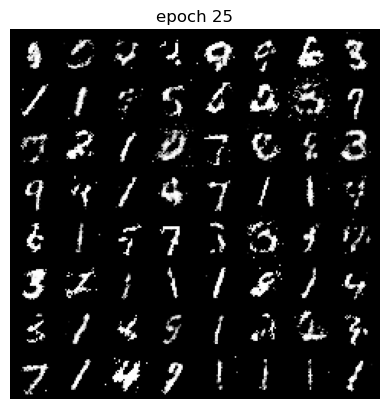

Epoch 25 of 100
Generator loss: 2.56953780, Discriminator loss: 0.55810661


118it [00:26,  4.40it/s]                                                                                               


Epoch 26 of 100
Generator loss: 2.55268255, Discriminator loss: 0.55628930


118it [00:27,  4.33it/s]                                                                                               


Epoch 27 of 100
Generator loss: 2.52140222, Discriminator loss: 0.58714436


118it [00:27,  4.29it/s]                                                                                               


Epoch 28 of 100
Generator loss: 2.40219375, Discriminator loss: 0.59331217


118it [00:26,  4.38it/s]                                                                                               


Epoch 29 of 100
Generator loss: 2.45544875, Discriminator loss: 0.57260065


118it [00:27,  4.31it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


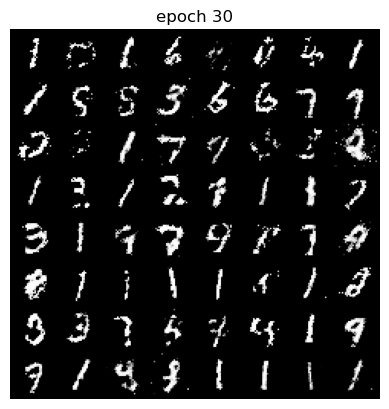

Epoch 30 of 100
Generator loss: 2.50298670, Discriminator loss: 0.56497169


118it [00:26,  4.42it/s]                                                                                               


Epoch 31 of 100
Generator loss: 2.51970073, Discriminator loss: 0.55988871


118it [00:27,  4.28it/s]                                                                                               


Epoch 32 of 100
Generator loss: 2.52010369, Discriminator loss: 0.56420762


118it [00:26,  4.37it/s]                                                                                               


Epoch 33 of 100
Generator loss: 2.42147507, Discriminator loss: 0.58210479


118it [00:26,  4.41it/s]                                                                                               


Epoch 34 of 100
Generator loss: 2.57460336, Discriminator loss: 0.56635707


118it [00:27,  4.32it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


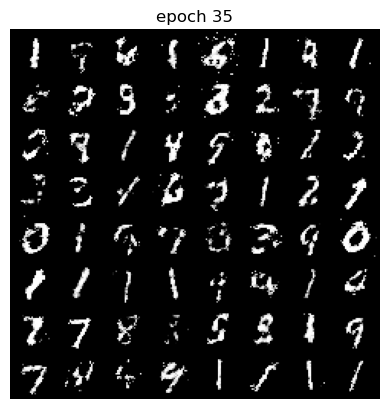

Epoch 35 of 100
Generator loss: 2.58183742, Discriminator loss: 0.57565756


118it [00:27,  4.32it/s]                                                                                               


Epoch 36 of 100
Generator loss: 2.59777397, Discriminator loss: 0.56338481


118it [00:27,  4.35it/s]                                                                                               


Epoch 37 of 100
Generator loss: 2.57461130, Discriminator loss: 0.56355278


118it [00:27,  4.34it/s]                                                                                               


Epoch 38 of 100
Generator loss: 2.48854798, Discriminator loss: 0.58833705


118it [00:27,  4.28it/s]                                                                                               


Epoch 39 of 100
Generator loss: 2.49801850, Discriminator loss: 0.58174335


118it [00:27,  4.37it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


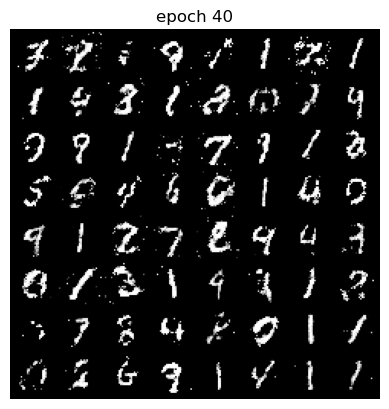

Epoch 40 of 100
Generator loss: 2.55347779, Discriminator loss: 0.57903133


118it [00:27,  4.36it/s]                                                                                               


Epoch 41 of 100
Generator loss: 2.62507645, Discriminator loss: 0.56245098


118it [00:26,  4.47it/s]                                                                                               


Epoch 42 of 100
Generator loss: 2.49758077, Discriminator loss: 0.56290948


118it [00:27,  4.37it/s]                                                                                               


Epoch 43 of 100
Generator loss: 2.59363511, Discriminator loss: 0.54825718


118it [00:27,  4.32it/s]                                                                                               


Epoch 44 of 100
Generator loss: 2.54693794, Discriminator loss: 0.55812826


118it [00:27,  4.24it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


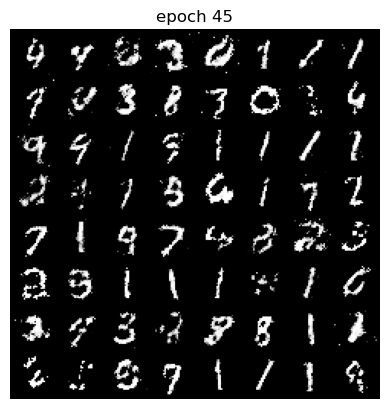

Epoch 45 of 100
Generator loss: 2.50504982, Discriminator loss: 0.56838767


118it [00:26,  4.38it/s]                                                                                               


Epoch 46 of 100
Generator loss: 2.46833642, Discriminator loss: 0.58522191


118it [00:26,  4.41it/s]                                                                                               


Epoch 47 of 100
Generator loss: 2.53554521, Discriminator loss: 0.58355104


118it [00:27,  4.32it/s]                                                                                               


Epoch 48 of 100
Generator loss: 2.49466713, Discriminator loss: 0.58985401


118it [00:26,  4.38it/s]                                                                                               


Epoch 49 of 100
Generator loss: 2.66417659, Discriminator loss: 0.53630128


118it [00:26,  4.47it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


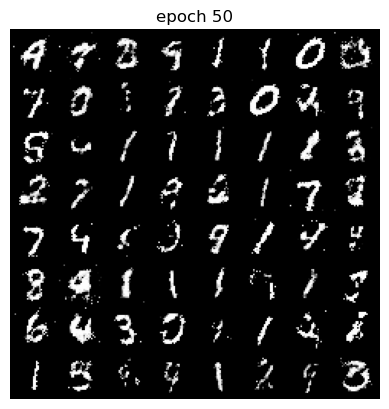

Epoch 50 of 100
Generator loss: 2.62055070, Discriminator loss: 0.54830843


118it [00:26,  4.39it/s]                                                                                               


Epoch 51 of 100
Generator loss: 2.61000818, Discriminator loss: 0.53764615


118it [00:26,  4.38it/s]                                                                                               


Epoch 52 of 100
Generator loss: 2.59251128, Discriminator loss: 0.54760489


118it [00:27,  4.30it/s]                                                                                               


Epoch 53 of 100
Generator loss: 2.44521259, Discriminator loss: 0.58732876


118it [00:26,  4.39it/s]                                                                                               


Epoch 54 of 100
Generator loss: 2.49335217, Discriminator loss: 0.57170875


118it [00:25,  4.68it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


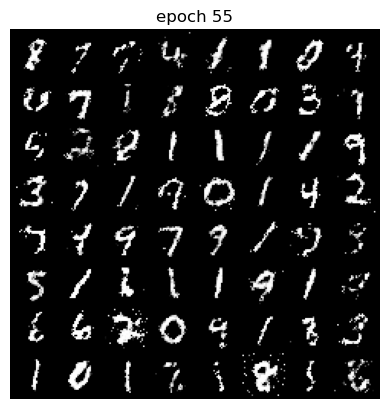

Epoch 55 of 100
Generator loss: 2.60097037, Discriminator loss: 0.55057368


118it [00:27,  4.23it/s]                                                                                               


Epoch 56 of 100
Generator loss: 2.53467776, Discriminator loss: 0.57299752


118it [00:27,  4.36it/s]                                                                                               


Epoch 57 of 100
Generator loss: 2.46374316, Discriminator loss: 0.58146044


118it [00:26,  4.39it/s]                                                                                               


Epoch 58 of 100
Generator loss: 2.67466541, Discriminator loss: 0.53723366


118it [00:26,  4.41it/s]                                                                                               


Epoch 59 of 100
Generator loss: 2.59345736, Discriminator loss: 0.53943970


118it [00:27,  4.35it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


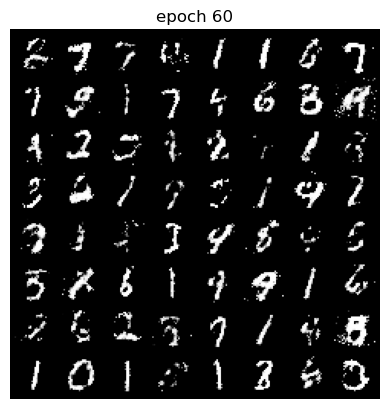

Epoch 60 of 100
Generator loss: 2.56254450, Discriminator loss: 0.57644798


118it [00:26,  4.39it/s]                                                                                               


Epoch 61 of 100
Generator loss: 2.53260074, Discriminator loss: 0.56876368


118it [00:27,  4.32it/s]                                                                                               


Epoch 62 of 100
Generator loss: 2.49093897, Discriminator loss: 0.58567115


118it [00:26,  4.46it/s]                                                                                               


Epoch 63 of 100
Generator loss: 2.48719189, Discriminator loss: 0.57179589


118it [00:27,  4.36it/s]                                                                                               


Epoch 64 of 100
Generator loss: 2.50994121, Discriminator loss: 0.57464540


118it [00:26,  4.45it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


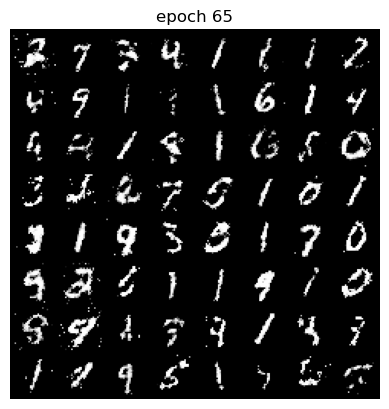

Epoch 65 of 100
Generator loss: 2.49123230, Discriminator loss: 0.56580726


118it [00:27,  4.33it/s]                                                                                               


Epoch 66 of 100
Generator loss: 2.54584970, Discriminator loss: 0.53865028


118it [00:26,  4.39it/s]                                                                                               


Epoch 67 of 100
Generator loss: 2.58614236, Discriminator loss: 0.55737488


118it [00:26,  4.39it/s]                                                                                               


Epoch 68 of 100
Generator loss: 2.57640291, Discriminator loss: 0.53458878


118it [00:26,  4.38it/s]                                                                                               


Epoch 69 of 100
Generator loss: 2.61039785, Discriminator loss: 0.53344174


118it [00:27,  4.37it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


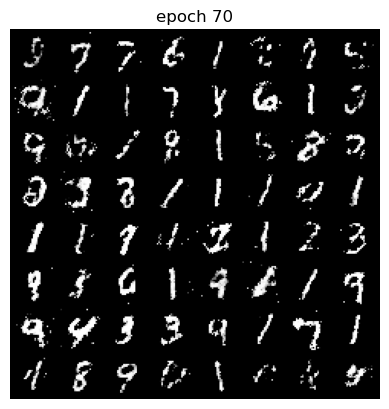

Epoch 70 of 100
Generator loss: 2.51208479, Discriminator loss: 0.55530867


118it [00:27,  4.31it/s]                                                                                               


Epoch 71 of 100
Generator loss: 2.59740430, Discriminator loss: 0.54079262


118it [00:27,  4.36it/s]                                                                                               


Epoch 72 of 100
Generator loss: 2.54265413, Discriminator loss: 0.56414877


118it [00:27,  4.24it/s]                                                                                               


Epoch 73 of 100
Generator loss: 2.50735503, Discriminator loss: 0.56891322


118it [00:26,  4.45it/s]                                                                                               


Epoch 74 of 100
Generator loss: 2.58520869, Discriminator loss: 0.55992497


118it [00:26,  4.41it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


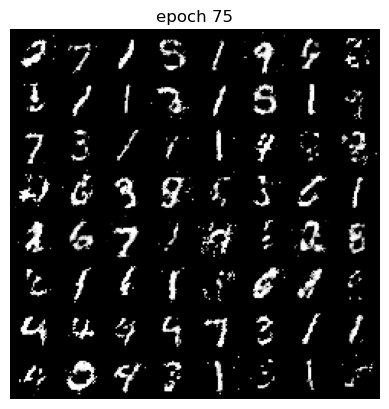

Epoch 75 of 100
Generator loss: 2.49275215, Discriminator loss: 0.57344958


118it [00:26,  4.43it/s]                                                                                               


Epoch 76 of 100
Generator loss: 2.55717815, Discriminator loss: 0.55081143


118it [00:27,  4.23it/s]                                                                                               


Epoch 77 of 100
Generator loss: 2.61400141, Discriminator loss: 0.54735676


118it [00:26,  4.40it/s]                                                                                               


Epoch 78 of 100
Generator loss: 2.53912412, Discriminator loss: 0.55695005


118it [00:26,  4.41it/s]                                                                                               


Epoch 79 of 100
Generator loss: 2.47839422, Discriminator loss: 0.58413507


118it [00:26,  4.38it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


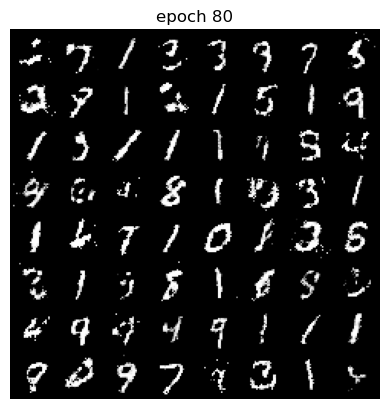

Epoch 80 of 100
Generator loss: 2.58151110, Discriminator loss: 0.56547925


118it [00:26,  4.47it/s]                                                                                               


Epoch 81 of 100
Generator loss: 2.56349933, Discriminator loss: 0.56783485


118it [00:26,  4.38it/s]                                                                                               


Epoch 82 of 100
Generator loss: 2.47197921, Discriminator loss: 0.57621578


118it [00:26,  4.37it/s]                                                                                               


Epoch 83 of 100
Generator loss: 2.49363717, Discriminator loss: 0.56217006


118it [00:27,  4.34it/s]                                                                                               


Epoch 84 of 100
Generator loss: 2.54235686, Discriminator loss: 0.54925255


118it [00:27,  4.34it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


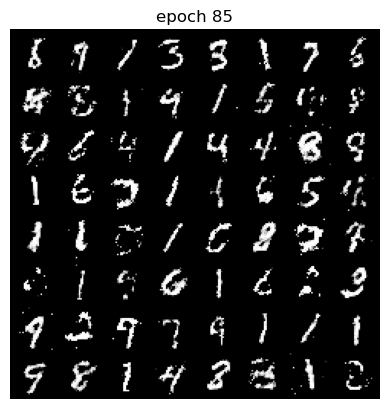

Epoch 85 of 100
Generator loss: 2.58938741, Discriminator loss: 0.55152124


118it [00:26,  4.43it/s]                                                                                               


Epoch 86 of 100
Generator loss: 2.64315849, Discriminator loss: 0.56179003


118it [00:26,  4.48it/s]                                                                                               


Epoch 87 of 100
Generator loss: 2.49607282, Discriminator loss: 0.58663089


118it [00:26,  4.38it/s]                                                                                               


Epoch 88 of 100
Generator loss: 2.50614830, Discriminator loss: 0.58423228


118it [00:26,  4.47it/s]                                                                                               


Epoch 89 of 100
Generator loss: 2.46993478, Discriminator loss: 0.57537451


118it [00:26,  4.44it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


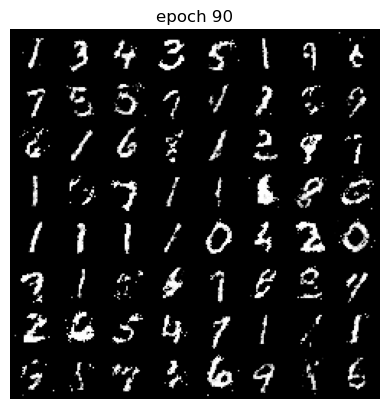

Epoch 90 of 100
Generator loss: 2.57081138, Discriminator loss: 0.56137917


118it [00:27,  4.27it/s]                                                                                               


Epoch 91 of 100
Generator loss: 2.50192373, Discriminator loss: 0.58810185


118it [00:27,  4.35it/s]                                                                                               


Epoch 92 of 100
Generator loss: 2.57390771, Discriminator loss: 0.56816000


118it [00:27,  4.27it/s]                                                                                               


Epoch 93 of 100
Generator loss: 2.56765218, Discriminator loss: 0.57789957


118it [00:29,  4.01it/s]                                                                                               


Epoch 94 of 100
Generator loss: 2.51701055, Discriminator loss: 0.57973292


118it [00:29,  4.00it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


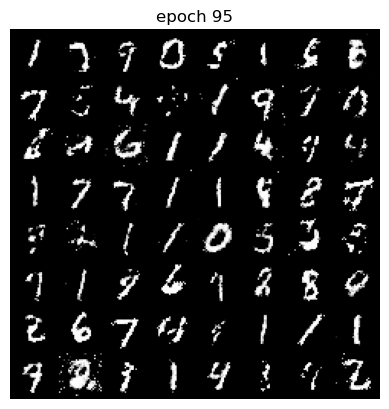

Epoch 95 of 100
Generator loss: 2.46467980, Discriminator loss: 0.57449727


118it [00:30,  3.90it/s]                                                                                               


Epoch 96 of 100
Generator loss: 2.49836235, Discriminator loss: 0.59109070


118it [00:30,  3.92it/s]                                                                                               


Epoch 97 of 100
Generator loss: 2.51571971, Discriminator loss: 0.57138953


118it [00:32,  3.62it/s]                                                                                               


Epoch 98 of 100
Generator loss: 2.56051669, Discriminator loss: 0.56861937


118it [00:34,  3.41it/s]                                                                                               


Epoch 99 of 100
Generator loss: 2.46316179, Discriminator loss: 0.60416764


118it [00:36,  3.24it/s]                                                                                               
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


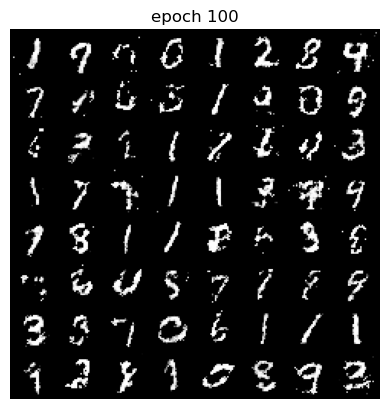

Epoch 100 of 100
Generator loss: 2.48327747, Discriminator loss: 0.58617222


In [27]:
torch.manual_seed(7777)
k = 2 # Changing number of times to apply discriminator

def generator_loss(output, true_label):
    # Generator loss
    return criterion(output, true_label)

def discriminator_loss(output, true_label):
    # Discriminator loss
    return criterion(output, true_label)
    

for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        
        real_images, _ = data
        real_images = real_images.to(device)

        # Update the discriminator multiple times
        for _ in range(k):
            optim_d.zero_grad()

            # Generate fake images
            fake_images = generator(noise)

            # Discriminator predictions for real and fake images
            real_preds = discriminator(real_images)
            fake_preds = discriminator(fake_images.detach())

            # Discriminator loss
            d_real_loss = discriminator_loss(real_preds, label_real(len(real_preds)))
            d_fake_loss = discriminator_loss(fake_preds, label_fake(len(fake_preds)))
            d_loss = d_real_loss + d_fake_loss

            # Backpropagation and optimization
            d_loss.backward()
            optim_d.step()
        
        # Train the generator
        optim_g.zero_grad()

        # Generate fake images
        fake_images = generator(noise)

        # Discriminator predictions for fake images
        fake_preds = discriminator(fake_images)

        # Generator loss
        g_loss = generator_loss(fake_preds, label_real(len(fake_preds)))

        # Backpropagation and optimization
        g_loss.backward()
        optim_g.step()

        # Update loss values
        loss_g += g_loss.item()
        loss_d += d_loss.item()
        
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [28]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/generator.pth')

DONE TRAINING


In [29]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/generator_images.gif', imgs)

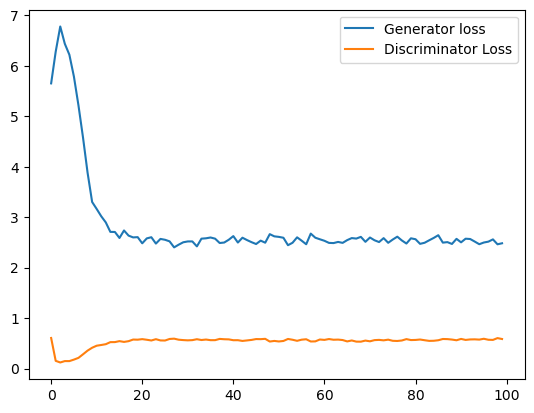

In [30]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/loss.png')